<a href="https://colab.research.google.com/github/MounikaRasaputra/MounikaRasaputra/blob/main/Litter_Image_Processing_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

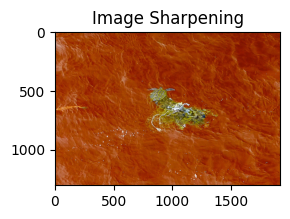

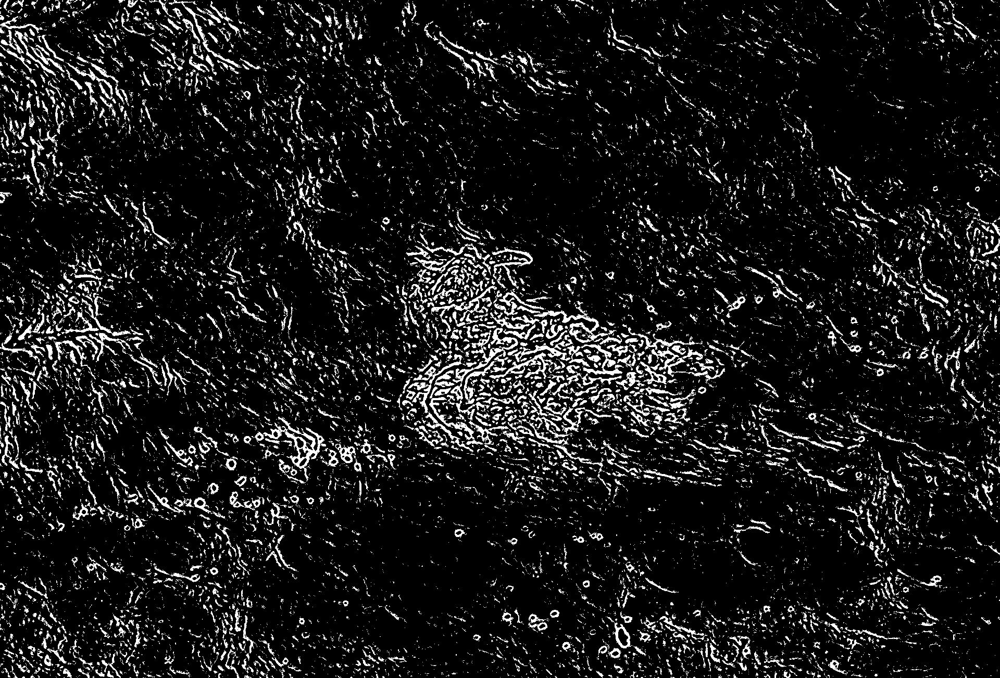

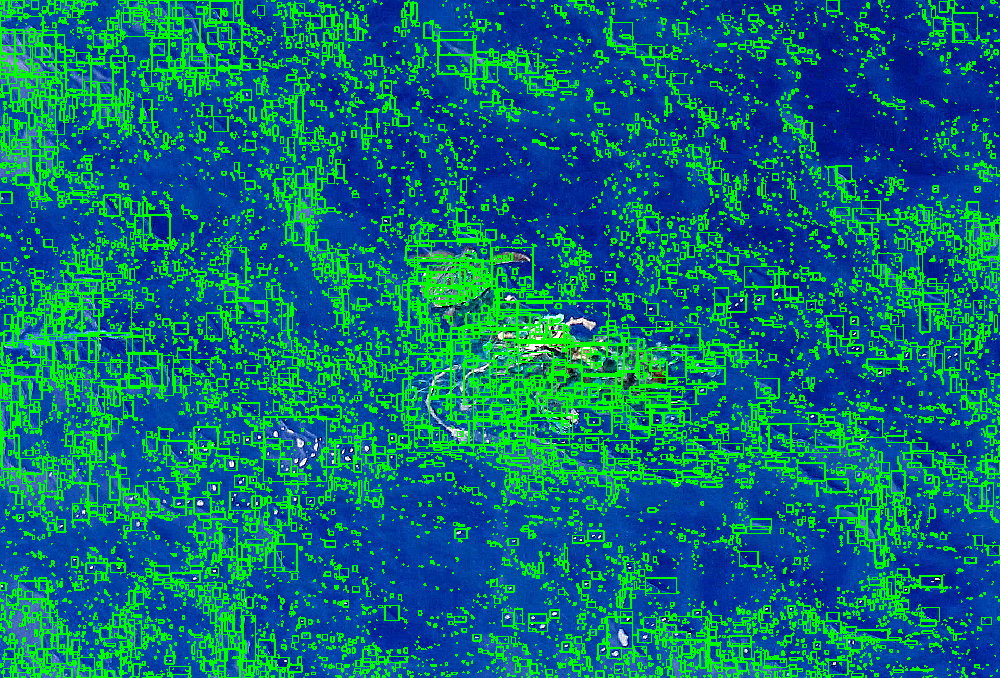

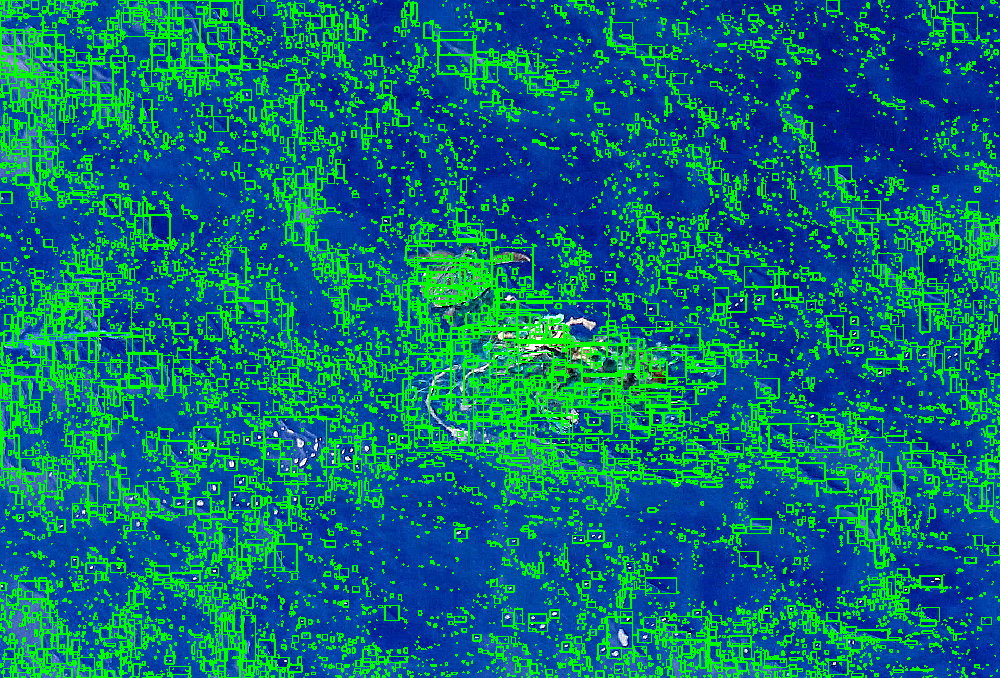

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load the image
img = cv2.imread('litt_2.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply a median blur to reduce noise
blur = cv2.medianBlur(gray, 5)

kernel_sharpening = np.array([[-1,-1,-1],
                              [-1,9,-1],
                              [-1,-1,-1]])

# applying different kernels to the input image
sharpened = cv2.filter2D(img, -1, kernel_sharpening)
img=sharpened


plt.subplot(1, 2, 2)
plt.title("Image Sharpening")
plt.imshow(sharpened)

plt.show()

# Apply adaptive thresholding to separate the litter from the background
thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
cv2_imshow(thresh)

# Find contours in the image
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

kernel_27x27=np.ones((27*27),np.float32)/(27*27)
# Draw bounding boxes around the detected contours
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    #roi_color = img[y:y+h, x:x+w]
    #blur=cv2.filter2D(roi_color,-1,kernel_27x27)
    #cv2_imshow(blur)
    #img[y:y+h,x:x+w]=blur
cv2_imshow(img)

# Display the result
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


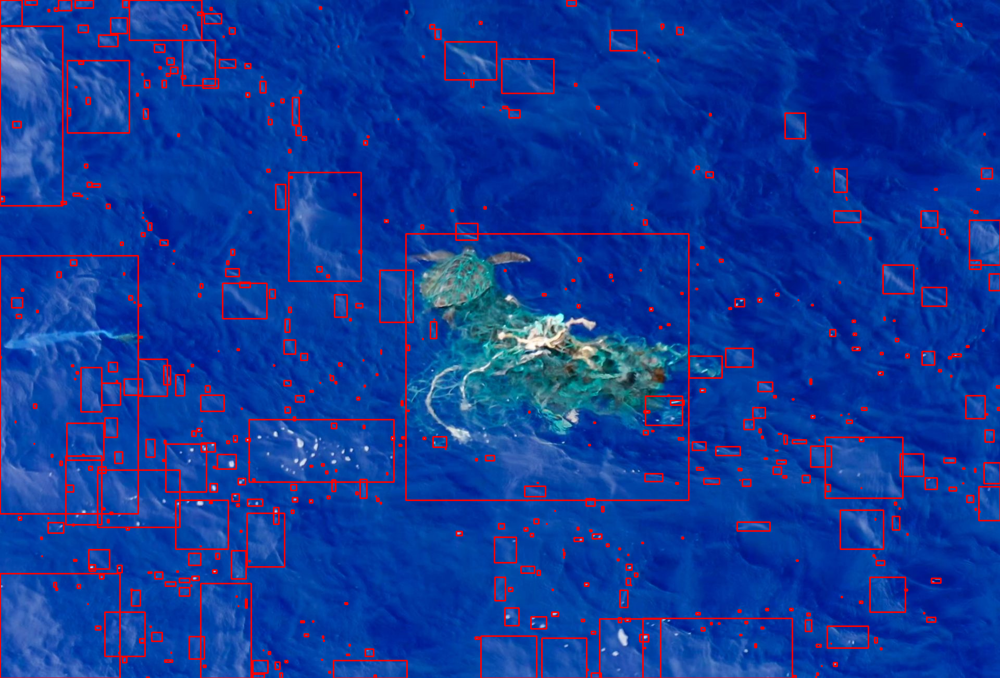

In [ ]:
import cv2
import numpy as np
from sklearn.cluster import KMeans

# Load the image
img = cv2.imread('litt_2.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Canny edge detection to find edges
edges = cv2.Canny(gray, 100, 200)

# Apply Hough line transform to detect straight lines
lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=100, minLineLength=100, maxLineGap=10)

# Draw the detected lines on the original image
#for line in lines:
 #   x1, y1, x2, y2 = line[0]
  #  cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Apply K-means clustering to group similar pixels
reshaped = img.reshape(-1, 3)
kmeans = KMeans(n_clusters=2).fit(reshaped)
labels = kmeans.predict(reshaped)
labels_2d = labels.reshape(img.shape[:2])

# Create a mask for the detected debris
mask = np.zeros_like(gray)
mask[labels_2d == 1] = 255

# Apply morphological operations to remove noise
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# Find contours in the mask
contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw bounding boxes around the detected debris
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 2)

# Display the result
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()


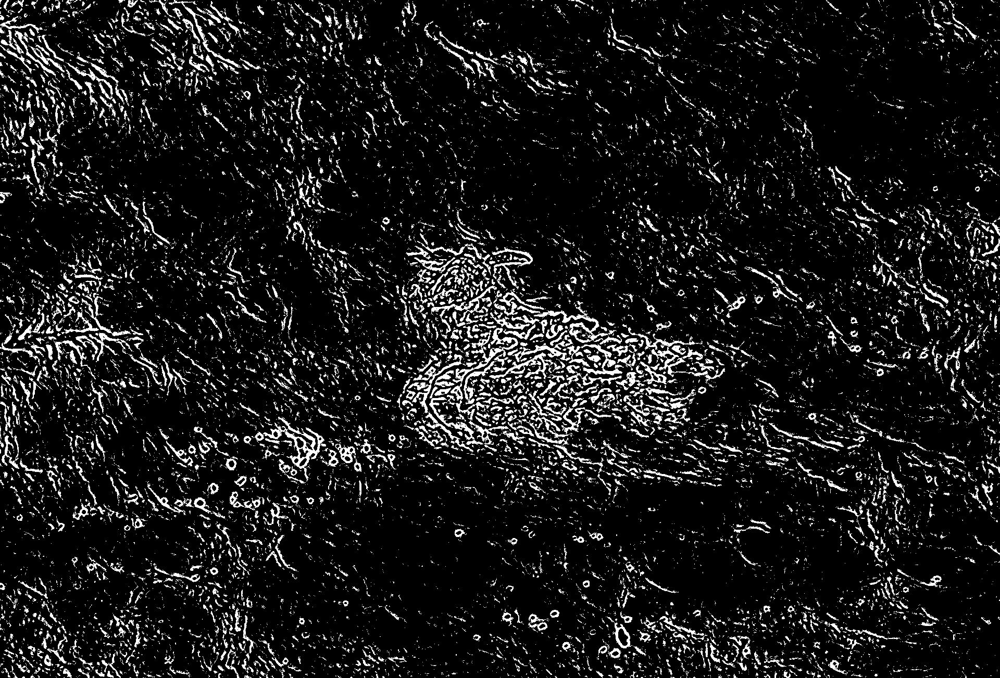

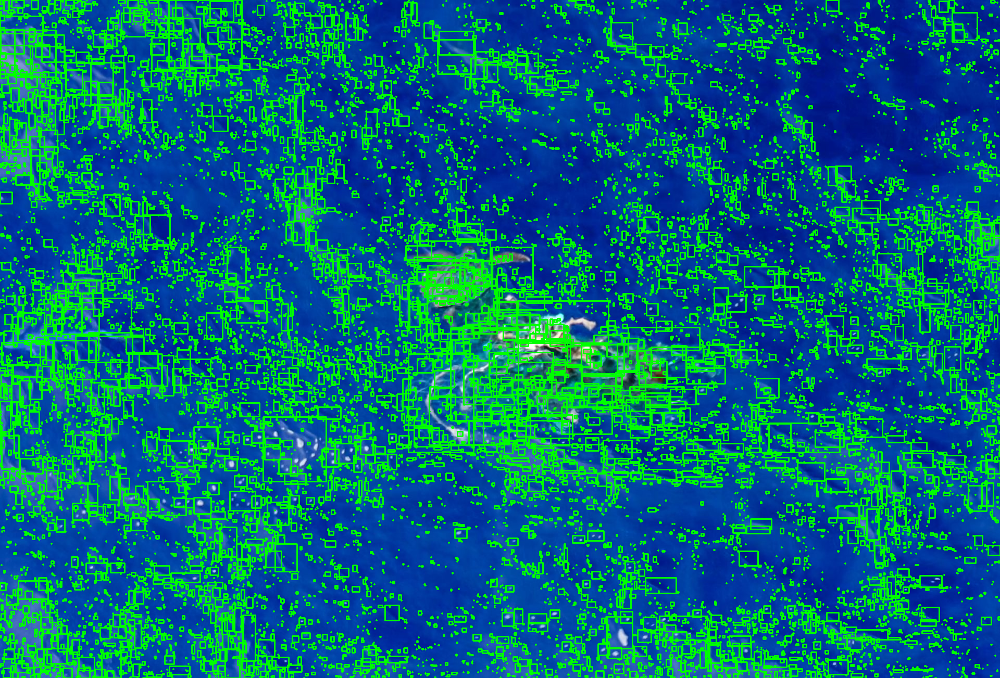

<Figure size 2000x2000 with 0 Axes>

<Figure size 2000x2000 with 0 Axes>

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt


# Load the image
img = cv2.imread('litt_2.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply a median blur to reduce noise
blur = cv2.medianBlur(gray, 5)

# Apply adaptive thresholding to separate the litter from the background
thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
cv2_imshow(thresh)

# Find contours in the image
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw bounding boxes around the detected contours
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    #cv2_imshow(img)

# Display the result
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()
plt.figure(figsize=(20, 20))



Number of Contours found = 5280


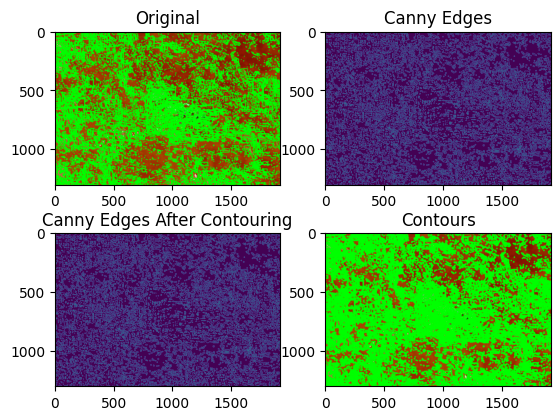

In [ ]:
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(img)


# Grayscale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# Find Canny edges
edged = cv2.Canny(gray, 30, 200)

plt.subplot(2, 2, 2)
plt.title("Canny Edges")
plt.imshow(edged)

# Finding Contours
# Use a copy of your image e.g. edged.copy(), since findContours alters the image
contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

plt.subplot(2, 2, 3)
plt.title("Canny Edges After Contouring")
plt.imshow(edged)

print("Number of Contours found = " + str(len(contours)))


# Draw all contours
# Use '-1' as the 3rd parameter to draw all
cv2.drawContours(img, contours, -1, (0,255,0), 3)

plt.subplot(2, 2, 4)
plt.title("Contours")
plt.imshow(img)

In [ ]:
import cv2
import numpy as np
from sklearn.cluster import KMeans

# Load the image
img = cv2.imread('litt_15.png',0)

# Convert the image to grayscale
gray = img

# Apply Canny edge detection to find edges
edges = cv2.Canny(gray, 100, 200)

# Apply Hough line transform to detect straight lines
lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=100, minLineLength=100, maxLineGap=10)

# Draw the detected lines on the original image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Apply K-means clustering to group similar pixels
reshaped = img.reshape(-1, 3)
kmeans = KMeans(n_clusters=2).fit(reshaped)
labels = kmeans.predict(reshaped)
labels_2d = labels.reshape(img.shape[:2])

# Create a mask for the detected debris
mask = np.zeros_like(gray)
mask[labels_2d == 1] = 255

# Apply morphological operations to remove noise
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# Find contours in the mask
contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw bounding boxes around the detected debris and count the number of contours
count = 0
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 2)
    count += 1

# Display the result and the number of contours
cv2.putText(img, f"Number of Contours: {count}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()


TypeError: ignored

# New Section